## *Will a patient be readmitted to a hospital within 30 days?*

![](https://dsuqs7rf8y6gn.cloudfront.net/wp-content/uploads/2019/03/patient-based.png)

# Patient Readmittance Analysis

## In this notebook, I have tried to analyze if a patient will be readmitted to a hostipal given certain medical and demographic data. To understand this data, certain degree of healthcare domain knowledge is needed, like ICD9 diagnosis codes. I have used pandas for EDA and data preprocessing and pyspark for modelling. Models used: Logistic Regression, Random Forest.I have also extracted the coefficients and important features from both models to find out which parameters have most weight on determining if a patient will be readmitted. 

### *If you have any questions or feedback, please comment! And if you find this notebook helpful, do leave an  UPVOTE*


### Importing required libraries

In [1]:
!pip install pyspark
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile
import numpy as np
import pyspark
from pyspark.sql import SparkSession
import numpy as np

spark = SparkSession.builder.getOrCreate()
sc = spark.sparkContext


from pyspark.ml import feature, regression,classification, Pipeline, evaluation 
from pyspark.sql import functions as fn, Row
from pyspark import sql

import matplotlib.pyplot as plt
import pandas as pd

     |████████████████████████████████| 217.8 MB 4.7 kB/s  eta 0:00:01
     |████████████████████████████████| 197 kB 39.1 MB/s eta 0:00:01
  Created wheel for pyspark: filename=pyspark-2.4.5-py2.py3-none-any.whl size=218258791 sha256=dca333fc1ec7d92ad821e81d9d6f1d0254136c3e5b8a657cea0c62442dbad15c
  Stored in directory: /root/.cache/pip/wheels/84/30/e3/c51c5cd0229631e662d29d7b578a3e5949a4c8db033ffb70aa
Successfully built pyspark


In [2]:
from pyspark.sql import SQLContext
sqlContext = SQLContext(sc)

### Data Exploration and Data Cleaning

In [3]:
df = pd.read_csv('../input/diabetes/diabetic_data.csv')


In [4]:
df

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [5]:
import pandas_profiling

In [6]:
df.profile_report()

In [7]:
df.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [8]:
df["readmitted"].value_counts()

NO     54864
>30    35545
<30    11357
Name: readmitted, dtype: int64

Columns 24 to 47 are medications which are categories. Most of the columns are nominal and categorical. We will deal with them by creating dummies. Notice that we are dropping one dummy. So during our interpretation we will have to interpret coefficients of other dummies with reference to the dropped dummy!

In [9]:
df = pd.get_dummies(df,columns = [df.columns.values[i] for i in range(24,47) ], prefix=[df.columns.values[i] for i in range(24,47)], prefix_sep='_',drop_first=True) 
##Dummy reference Medication Down

In [10]:
df.shape

(101766, 75)

In [11]:
df.columns

Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'change', 'diabetesMed', 'readmitted', 'metformin_No',
       'metformin_Steady', 'metformin_Up', 'repaglinide_No',
       'repaglinide_Steady', 'repaglinide_Up', 'nateglinide_No',
       'nateglinide_Steady', 'nateglinide_Up', 'chlorpropamide_No',
       'chlorpropamide_Steady', 'chlorpropamide_Up', 'glimepiride_No',
       'glimepiride_Steady', 'glimepiride_Up', 'acetohexamide_Steady',
       'glipizide_No', 'glipizide_Steady', 'glipizide_Up', 'glyburide_No',
       'glyburide_Steady', 'glyburide_Up', 'tolbutamide_Steady',
       'pioglitazone_No', '

This is our target variable. We convert it to 0 and 1 for Binary Classification.

In [12]:
df['readmitted'] = df['readmitted'].map({'NO': 0, '<30': 1, ">30":2})
df['readmittedbinary'] = df['readmitted'].map({0: 0, 1: 1, 2:1})

In [13]:
df = pd.get_dummies(df, columns=["change",'max_glu_serum','A1Cresult','diabetesMed'], prefix = ["change",'max_glu_serum','A1Cresult','diabetesMed'],prefix_sep='_',drop_first=True)
## Dummy Reference A1Cresult_>7,max_glu_serum>200,diabetesMed=No, change=ch

In [14]:
df['age'] = df['age'].map({'[0-10)':5,'[10-20)':15, '[20-30)':25,'[30-40)':35,'[40-50)':45,'[50-60)':55,'[60-70)':65,'[70-80)':75,'[80-90)':85,'[90-100)':95})

In [15]:
df.drop(['encounter_id','patient_nbr','weight','admission_type_id','discharge_disposition_id','admission_source_id','medical_specialty','payer_code'],axis=1,inplace=True)



In [16]:
df=df.loc[df['gender'].isin(['Male','Female'])]#df.loc[df['B'].isin(['one','three'])]

In [17]:
df.replace('?', np.nan, inplace = True)

In [18]:
df= df.dropna()##Clean pandas df without dummy variables 

In [19]:
df.columns

Index(['race', 'gender', 'age', 'time_in_hospital', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'readmitted', 'metformin_No', 'metformin_Steady',
       'metformin_Up', 'repaglinide_No', 'repaglinide_Steady',
       'repaglinide_Up', 'nateglinide_No', 'nateglinide_Steady',
       'nateglinide_Up', 'chlorpropamide_No', 'chlorpropamide_Steady',
       'chlorpropamide_Up', 'glimepiride_No', 'glimepiride_Steady',
       'glimepiride_Up', 'acetohexamide_Steady', 'glipizide_No',
       'glipizide_Steady', 'glipizide_Up', 'glyburide_No', 'glyburide_Steady',
       'glyburide_Up', 'tolbutamide_Steady', 'pioglitazone_No',
       'pioglitazone_Steady', 'pioglitazone_Up', 'rosiglitazone_No',
       'rosiglitazone_Steady', 'rosiglitazone_Up', 'acarbose_No',
       'acarbose_Steady', 'acarbose_Up', 'miglitol_No', 'miglitol_Steady',
       'miglitol_Up', 

### Data Visualization

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

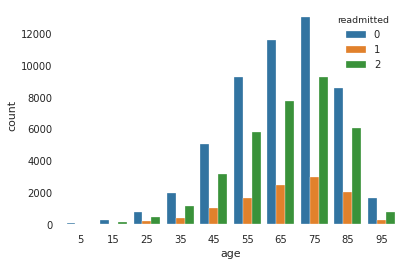

In [21]:
a = sns.countplot(x = df['age'], hue= df['readmitted'])

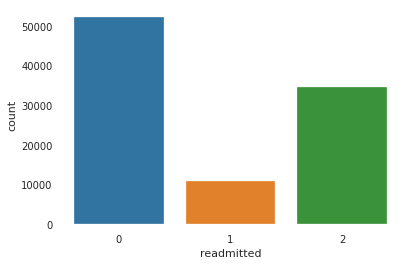

In [22]:
d = sns.countplot(x = df['readmitted'])

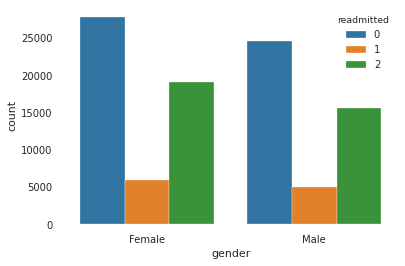

In [23]:
b = sns.countplot(x = df['gender'], hue= df['readmitted'])

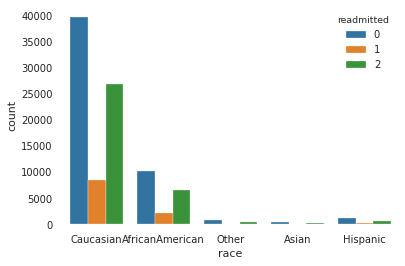

In [24]:
c = sns.countplot(x = df['race'], hue= df['readmitted'])

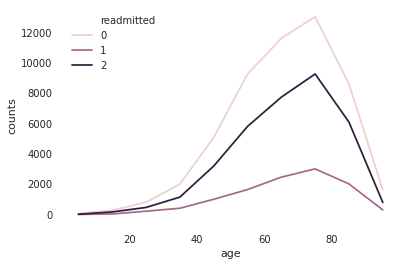

In [25]:
count_of_y = df["age"].groupby(df["readmitted"]).value_counts().rename("counts").reset_index()
count_of_y
fig = sns.lineplot(x="age", y="counts", hue="readmitted", data=count_of_y)

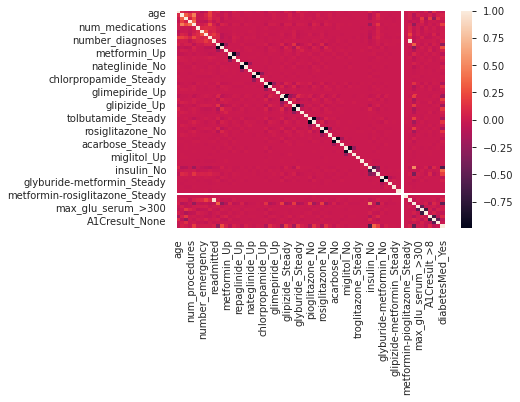

In [26]:
sns.heatmap(df.corr())

In [27]:
plt.figure(figsize=(25, 8))
a = df.corr()
b = a['readmitted']
c= b.to_frame()
type(c)
c.sort_values(by = ['readmitted'], ascending = False , inplace = True)
pos = c.head(8)
c.sort_values(by = ['readmitted'], ascending = True , inplace = True)
neg = c.head(8)
neg


,readmitted
num_procedures,-0.045244
change_No,-0.041999
insulin_No,-0.037945
metformin_Steady,-0.020696
repaglinide_No,-0.020496
glipizide_No,-0.019456
A1Cresult_Norm,-0.018938
acarbose_No,-0.017195


<Figure size 1800x576 with 0 Axes>

In [28]:
pos.index.name = 'feature'
pos.reset_index(inplace=True)
pos


,feature,readmitted
0,readmitted,1.000000
1,readmittedbinary,0.948634
2,number_inpatient,0.175999
3,number_diagnoses,0.096760
4,number_emergency,0.089030
5,number_outpatient,0.079847
6,diabetesMed_Yes,0.057924
7,time_in_hospital,0.037750


In [29]:
neg.index.name = 'feature'
neg.reset_index(inplace=True)
neg

,feature,readmitted
0,num_procedures,-0.045244
1,change_No,-0.041999
2,insulin_No,-0.037945
3,metformin_Steady,-0.020696
4,repaglinide_No,-0.020496
5,glipizide_No,-0.019456
6,A1Cresult_Norm,-0.018938
7,acarbose_No,-0.017195


In [30]:
pos=pos.drop(pos.index[0:2])
pos

,feature,readmitted
2,number_inpatient,0.175999
3,number_diagnoses,0.096760
4,number_emergency,0.089030
5,number_outpatient,0.079847
6,diabetesMed_Yes,0.057924
7,time_in_hospital,0.037750


[Text(0, 0, 'number_inpatient'),
 Text(0, 0, 'number_diagnoses'),
 Text(0, 0, 'number_emergency'),
 Text(0, 0, 'number_outpatient'),
 Text(0, 0, 'diabetesMed_Yes'),
 Text(0, 0, 'time_in_hospital')]

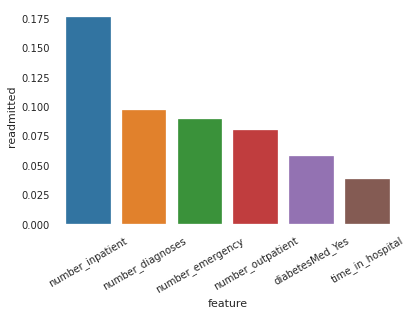

In [31]:
posplot = sns.barplot(x='feature', y="readmitted", data=pos)
posplot.set_xticklabels(posplot.get_xticklabels(),rotation=30)

[Text(0, 0, 'num_procedures'),
 Text(0, 0, 'change_No'),
 Text(0, 0, 'insulin_No'),
 Text(0, 0, 'metformin_Steady'),
 Text(0, 0, 'repaglinide_No'),
 Text(0, 0, 'glipizide_No'),
 Text(0, 0, 'A1Cresult_Norm'),
 Text(0, 0, 'acarbose_No')]

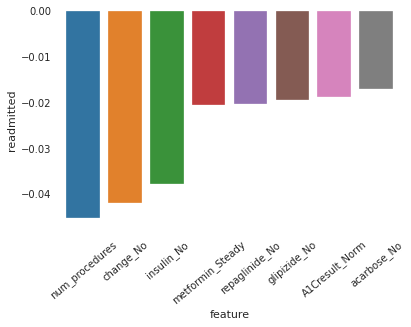

In [32]:
negplot = sns.barplot(x='feature', y="readmitted", data=neg)
negplot
negplot.set_xticklabels(negplot.get_xticklabels(),rotation=40)

In [33]:
df.to_csv("clean.csv")

In [34]:
sorted(df.columns)

['A1Cresult_>8',
 'A1Cresult_None',
 'A1Cresult_Norm',
 'acarbose_No',
 'acarbose_Steady',
 'acarbose_Up',
 'acetohexamide_Steady',
 'age',
 'change_No',
 'chlorpropamide_No',
 'chlorpropamide_Steady',
 'chlorpropamide_Up',
 'diabetesMed_Yes',
 'diag_1',
 'diag_2',
 'diag_3',
 'gender',
 'glimepiride-pioglitazone_Steady',
 'glimepiride_No',
 'glimepiride_Steady',
 'glimepiride_Up',
 'glipizide-metformin_Steady',
 'glipizide_No',
 'glipizide_Steady',
 'glipizide_Up',
 'glyburide-metformin_No',
 'glyburide-metformin_Steady',
 'glyburide-metformin_Up',
 'glyburide_No',
 'glyburide_Steady',
 'glyburide_Up',
 'insulin_No',
 'insulin_Steady',
 'insulin_Up',
 'max_glu_serum_>300',
 'max_glu_serum_None',
 'max_glu_serum_Norm',
 'metformin-pioglitazone_Steady',
 'metformin-rosiglitazone_Steady',
 'metformin_No',
 'metformin_Steady',
 'metformin_Up',
 'miglitol_No',
 'miglitol_Steady',
 'miglitol_Up',
 'nateglinide_No',
 'nateglinide_Steady',
 'nateglinide_Up',
 'num_lab_procedures',
 'num_medic

In [35]:
df

,race,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,...,metformin-pioglitazone_Steady,readmittedbinary,change_No,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,diabetesMed_Yes
1,Caucasian,Female,15,3,59,0,18,0,0,0,...,0,1,0,0,1,0,0,1,0,1
2,AfricanAmerican,Female,25,2,11,5,13,2,0,1,...,0,0,1,0,1,0,0,1,0,1
3,Caucasian,Male,35,2,44,1,16,0,0,0,...,0,0,0,0,1,0,0,1,0,1
4,Caucasian,Male,45,1,51,0,8,0,0,0,...,0,0,0,0,1,0,0,1,0,1
5,Caucasian,Male,55,3,31,6,16,0,0,0,...,0,1,1,0,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,Male,75,3,51,0,16,0,0,0,...,0,1,0,0,1,0,1,0,0,1
101762,AfricanAmerican,Female,85,5,33,3,18,0,0,1,...,0,0,1,0,1,0,0,1,0,1
101763,Caucasian,Male,75,1,53,0,9,1,0,0,...,0,0,0,0,1,0,0,1,0,1
101764,Caucasian,Female,85,10,45,2,21,0,0,1,...,0,0,0,0,1,0,0,1,0,1


### Creating a Spark DataFrame

In [36]:
spark_df = spark.read.csv('clean.csv', header=True, inferSchema=True)

In [37]:
spark_df.show()

+---+---------------+------+---+----------------+------------------+--------------+---------------+-----------------+----------------+----------------+------+------+------+----------------+----------+------------+----------------+------------+--------------+------------------+--------------+--------------+------------------+--------------+-----------------+---------------------+-----------------+--------------+------------------+--------------+--------------------+------------+----------------+------------+------------+----------------+------------+------------------+---------------+-------------------+---------------+----------------+--------------------+----------------+-----------+---------------+-----------+-----------+---------------+-----------+-------------------+-----------------+-------------+----------+--------------+----------+----------------------+--------------------------+----------------------+--------------------------+-------------------------------+------------------

In [38]:
#spark_df=spark_df.withColumnRenamed("glimepiride-poglitazone","glimepiridepoglitazone").withColumnRenamed("glyburide-metformin","glyburidemetformin").withColumnRenamed("glipizide-metformin","glipizidemetformin").withColumnRenamed("glimepiride-pioglitazone","glimepiridepioglitazone").withColumnRenamed("metformin-rosiglitazone","metforminrosiglitazone").withColumnRenamed("metformin-pioglitazone","metforminpioglitazone")

### Feature Engineering

Here, I created a function to deal with ICD-9 codes. Please read the data description for more information about these codes.

In [39]:
def amit(row):    
    ma=0
    mb=0
    md=0
    me=0
    sa=0
    dr=dd=ddt=di=dm=dg=dn=dr2=dd2=ddt2=di2=dm2=dg2=dn2=dr3=dd3=ddt3=di3=dm3=dg3=dn3=0
    
    if "V" in row.diag_1 or "E" in row.diag_1:
        dr=dd=ddt=di=dm=dg=dn=0
    #elif 390 <= float(row.diag_1) <= 459 or float(row.diag_1) == 785: #DUMMY DROPPED REFERENCE
    #    dc =1 ##Circulatory
    elif 460 <= float(row.diag_1) <= 519 or float(row.diag_1) == 786:
        dr =1 #Respiratory
    elif 520 <= float(row.diag_1) <= 579 or float(row.diag_1) == 787:
        dd =1 #Digestive
    elif 250 <= float(row.diag_1) <= 250.999:
        ddt =1 #Diabetes
    elif 800 <= float(row.diag_1) <= 999:
        di =1 #Injury
    elif 710 <= float(row.diag_1) <= 739:
        dm =1 #musculoskeletal
    elif 580 <= float(row.diag_1) <= 629 or float(row.diag_1) == 788:
        dg =1 #Genitourinary
    elif 140 <= float(row.diag_1) <= 239:
        dn =1 #Neoplasms
    else:
        dr=dd=ddt=di=dm=dg=dn=0
        #do=1#others
        
    if "V" in row.diag_2 or "E" in row.diag_2:
        #do2=1
        dr2=dd2=ddt2=di2=dm2=dg2=dn2=0
    #elif 390 <= float(row.diag_2) <= 459 or float(row.diag_2) == 785: #DUMMY DROPPED REFERENCE
    #    dc2 =1 ##Circulatory
    elif 460 <= float(row.diag_2) <= 519 or float(row.diag_2) == 786:
        dr2 =1 #Respiratory
    elif 520 <= float(row.diag_2) <= 579 or float(row.diag_2) == 787:
        dd2 =1 #Digestive
    elif 250 <= float(row.diag_2) <= 250.999:
        ddt2 =1 #Diabetes
    elif 800 <= float(row.diag_2) <= 999:
        di2 =1 #Injury
    elif 710 <= float(row.diag_2) <= 739:
        dm2 =2 #musculoskeletal
    elif 580 <= float(row.diag_2) <= 629 or float(row.diag_2) == 788:
        dg2 =1 #Genitourinary
    #elif 140 <= float(row.diag_2) <= 239:
    #   dn2 =1 #Neoplasms
    else:
        #do2=1#others
        dr2=dd2=ddt2=di2=dm2=dg2=dn2=0
        
    if "V" in row.diag_3 or "E" in row.diag_3:
        #do3=1
        dr3=dd3=ddt3=di3=dm3=dg3=dn3=0
    #elif 390 <= float(row.diag_3) <= 459 or float(row.diag_3) == 785:#DUMMY DROPPED REFERENCE
    #    dc3 =1 ##Circulatory
    elif 460 <= float(row.diag_3) <= 519 or float(row.diag_3) == 786:
        dr3 =1 #Respiratory
    elif 520 <= float(row.diag_3) <= 579 or float(row.diag_3) == 787:
        dd3 =1 #Digestive
    elif 250 <= float(row.diag_3) <= 250.999:
        ddt3 =1 #Diabetes
    elif 800 <= float(row.diag_3) <= 999:
        di3 =1 #Injury
    elif 710 <= float(row.diag_3) <= 739:
        dm3 =1 #musculoskeletal
    elif 580 <= float(row.diag_3) <= 629 or float(row.diag_3) == 788:
        dg3 =1 #Genitourinary
    elif 140 <= float(row.diag_3) <= 239:
        dn3 =1 #Neoplasms
    else:
        dr3=dd3=ddt3=di3=dm3=dg3=dn3=0
        #do3=1#others  

    
    if row.race == "Caucasian":
        ma = 1
        #prfloat("A")
    elif row.race == "Asian":
        mb = 1
    #elif row.race == "AfricanAmerican": #DUMMY DROPPED REFERENCE
    #    mc = 1
    elif row.race =="Hispanic":
        me = 1
    else:# :
        ma=0
        mb=0
        me = 0


    if row.gender == "Male":
        sa = 1
    #elif row.gender == "Female": #DROPPED DUMMY REFERENCE
    #    sb = 1
    
    
    r = Row(Caucasian=int(ma) ,Asian=int(mb) ,Hispanic=int(me),male=float(sa),
            Respiratory=dr,
            Digestive= dd,
            Diabetes = ddt,
            Injury= di,
            Muscuskeletal= dm,
            Neoplasms=dn,
            Genitourinary = dg,
            
            Respiratory2=dr2,
            Digestive2= dd2,
            Diabetes2 = ddt2,
            Injury2= di2,
            Muscuskeletal2= dm2,
            Neoplasms2=dn2,
            Genitourinary2 = dg2,
            
            Respiratory3=dr3,
            Digestive3= dd3,
            Diabetes3 = ddt3,
            Injury3= di3,
            Muscuskeletal3= dm3,
            Neoplasms3=dn3,
            Genitourinary3 = dg3,
            
      )
    return(r)

In [40]:
dummy_df = spark.createDataFrame(spark_df.rdd.map(amit))

In [41]:
spark_df.show()

+---+---------------+------+---+----------------+------------------+--------------+---------------+-----------------+----------------+----------------+------+------+------+----------------+----------+------------+----------------+------------+--------------+------------------+--------------+--------------+------------------+--------------+-----------------+---------------------+-----------------+--------------+------------------+--------------+--------------------+------------+----------------+------------+------------+----------------+------------+------------------+---------------+-------------------+---------------+----------------+--------------------+----------------+-----------+---------------+-----------+-----------+---------------+-----------+-------------------+-----------------+-------------+----------+--------------+----------+----------------------+--------------------------+----------------------+--------------------------+-------------------------------+------------------

In [42]:
dummy_df.show()

+-----+---------+--------+---------+---------+---------+----------+----------+-------------+--------------+--------------+--------+------+-------+-------+-------------+--------------+--------------+---------+----------+----------+-----------+------------+------------+----+
|Asian|Caucasian|Diabetes|Diabetes2|Diabetes3|Digestive|Digestive2|Digestive3|Genitourinary|Genitourinary2|Genitourinary3|Hispanic|Injury|Injury2|Injury3|Muscuskeletal|Muscuskeletal2|Muscuskeletal3|Neoplasms|Neoplasms2|Neoplasms3|Respiratory|Respiratory2|Respiratory3|male|
+-----+---------+--------+---------+---------+---------+----------+----------+-------------+--------------+--------------+--------+------+-------+-------+-------------+--------------+--------------+---------+----------+----------+-----------+------------+------------+----+
|    0|        1|       0|        1|        0|        0|         0|         0|            0|             0|             0|       0|     0|      0|      0|            0|          

I am joining the two spark dataframes here on row number. This will be our final data with all dummy variables.

In [43]:
from pyspark.sql.functions import monotonically_increasing_id, row_number
from pyspark.sql.window import Window
# since there is no common column between these two dataframes add row_index so that it can be joined
spark_df=spark_df.withColumn('row_index', row_number().over(Window.orderBy(monotonically_increasing_id())))
dummy_df=dummy_df.withColumn('row_index', row_number().over(Window.orderBy(monotonically_increasing_id())))

dummy_df = dummy_df.join(spark_df, on=["row_index"]).drop("row_index")
dummy_df.show()


+-----+---------+--------+---------+---------+---------+----------+----------+-------------+--------------+--------------+--------+------+-------+-------+-------------+--------------+--------------+---------+----------+----------+-----------+------------+------------+----+---+---------------+------+---+----------------+------------------+--------------+---------------+-----------------+----------------+----------------+------+------+------+----------------+----------+------------+----------------+------------+--------------+------------------+--------------+--------------+------------------+--------------+-----------------+---------------------+-----------------+--------------+------------------+--------------+--------------------+------------+----------------+------------+------------+----------------+------------+------------------+---------------+-------------------+---------------+----------------+--------------------+----------------+-----------+---------------+-----------+-------

Dropping these columns as we already have their dummies

In [44]:
dummy_df = dummy_df.drop("diag_1","diag_2","diag_3","gender","race")

In [45]:
dummy_df = dummy_df.drop("_c0")

In [46]:
#Checking dummies

In [47]:
dummy_df.select('male',"Caucasian","Hispanic","Asian").show()#,'Male','Female', 'Circulatory','Circulatory2','Circulatory3').show()

+----+---------+--------+-----+
|male|Caucasian|Hispanic|Asian|
+----+---------+--------+-----+
| 0.0|        1|       0|    0|
| 0.0|        0|       0|    0|
| 1.0|        1|       0|    0|
| 1.0|        1|       0|    0|
| 1.0|        1|       0|    0|
| 1.0|        1|       0|    0|
| 1.0|        1|       0|    0|
| 0.0|        1|       0|    0|
| 0.0|        1|       0|    0|
| 0.0|        0|       0|    0|
| 1.0|        0|       0|    0|
| 0.0|        1|       0|    0|
| 1.0|        1|       0|    0|
| 0.0|        0|       0|    0|
| 1.0|        0|       0|    0|
| 1.0|        0|       0|    0|
| 0.0|        1|       0|    0|
| 1.0|        0|       0|    0|
| 0.0|        0|       0|    0|
| 0.0|        1|       0|    0|
+----+---------+--------+-----+
only showing top 20 rows



In [48]:
dummy_df.printSchema()

root
 |-- Asian: long (nullable = true)
 |-- Caucasian: long (nullable = true)
 |-- Diabetes: long (nullable = true)
 |-- Diabetes2: long (nullable = true)
 |-- Diabetes3: long (nullable = true)
 |-- Digestive: long (nullable = true)
 |-- Digestive2: long (nullable = true)
 |-- Digestive3: long (nullable = true)
 |-- Genitourinary: long (nullable = true)
 |-- Genitourinary2: long (nullable = true)
 |-- Genitourinary3: long (nullable = true)
 |-- Hispanic: long (nullable = true)
 |-- Injury: long (nullable = true)
 |-- Injury2: long (nullable = true)
 |-- Injury3: long (nullable = true)
 |-- Muscuskeletal: long (nullable = true)
 |-- Muscuskeletal2: long (nullable = true)
 |-- Muscuskeletal3: long (nullable = true)
 |-- Neoplasms: long (nullable = true)
 |-- Neoplasms2: long (nullable = true)
 |-- Neoplasms3: long (nullable = true)
 |-- Respiratory: long (nullable = true)
 |-- Respiratory2: long (nullable = true)
 |-- Respiratory3: long (nullable = true)
 |-- male: double (nullable = tr

# Splitting into training, testing and validation

In [49]:
training_df, validation_df, testing_df = dummy_df.randomSplit([0.6, 0.3, 0.1], seed=0)

# Looking at our final columns

In [50]:
dummy_df.columns

['Asian',
 'Caucasian',
 'Diabetes',
 'Diabetes2',
 'Diabetes3',
 'Digestive',
 'Digestive2',
 'Digestive3',
 'Genitourinary',
 'Genitourinary2',
 'Genitourinary3',
 'Hispanic',
 'Injury',
 'Injury2',
 'Injury3',
 'Muscuskeletal',
 'Muscuskeletal2',
 'Muscuskeletal3',
 'Neoplasms',
 'Neoplasms2',
 'Neoplasms3',
 'Respiratory',
 'Respiratory2',
 'Respiratory3',
 'male',
 'age',
 'time_in_hospital',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'number_diagnoses',
 'readmitted',
 'metformin_No',
 'metformin_Steady',
 'metformin_Up',
 'repaglinide_No',
 'repaglinide_Steady',
 'repaglinide_Up',
 'nateglinide_No',
 'nateglinide_Steady',
 'nateglinide_Up',
 'chlorpropamide_No',
 'chlorpropamide_Steady',
 'chlorpropamide_Up',
 'glimepiride_No',
 'glimepiride_Steady',
 'glimepiride_Up',
 'acetohexamide_Steady',
 'glipizide_No',
 'glipizide_Steady',
 'glipizide_Up',
 'glyburide_No',
 'glyburide_Steady',
 'glyburide

In [51]:
featlist = ['Asian',
 'Caucasian',
 'Diabetes',
 'Diabetes2',
 'Diabetes3',
 'Digestive',
 'Digestive2',
 'Digestive3',
 'Genitourinary',
 'Genitourinary2',
 'Genitourinary3',
 'Hispanic',
 'Injury',
 'Injury2',
 'Injury3',
 'Muscuskeletal',
 'Muscuskeletal2',
 'Muscuskeletal3',
 'Neoplasms',
 'Neoplasms2',
 'Neoplasms3',
 'Respiratory',
 'Respiratory2',
 'Respiratory3',
 'male',
 'age',
 'time_in_hospital',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'number_diagnoses',
 'metformin_No',
 'metformin_Steady',
 'metformin_Up',
 'repaglinide_No',
 'repaglinide_Steady',
 'repaglinide_Up',
 'nateglinide_No',
 'nateglinide_Steady',
 'nateglinide_Up',
 'chlorpropamide_No',
 'chlorpropamide_Steady',
 'chlorpropamide_Up',
 'glimepiride_No',
 'glimepiride_Steady',
 'glimepiride_Up',
 'acetohexamide_Steady',
 'glipizide_No',
 'glipizide_Steady',
 'glipizide_Up',
 'glyburide_No',
 'glyburide_Steady',
 'glyburide_Up',
 'tolbutamide_Steady',
 'pioglitazone_No',
 'pioglitazone_Steady',
 'pioglitazone_Up',
 'rosiglitazone_No',
 'rosiglitazone_Steady',
 'rosiglitazone_Up',
 'acarbose_No',
 'acarbose_Steady',
 'acarbose_Up',
 'miglitol_No',
 'miglitol_Steady',
 'miglitol_Up',
 'troglitazone_Steady',
 'tolazamide_Steady',
 'tolazamide_Up',
 'insulin_No',
 'insulin_Steady',
 'insulin_Up',
 'glyburide-metformin_No',
 'glyburide-metformin_Steady',
 'glyburide-metformin_Up',
 'glipizide-metformin_Steady',
 'glimepiride-pioglitazone_Steady',
 'metformin-rosiglitazone_Steady',
 'metformin-pioglitazone_Steady',
 'change_No',
 'max_glu_serum_>300',
 'max_glu_serum_None',
 'max_glu_serum_Norm',
 'A1Cresult_>8',
 'A1Cresult_None',
 'A1Cresult_Norm',
 'diabetesMed_Yes']

### Model Building and Evaluation

# Logistic model 1 with all features no parameter tuning

In [52]:
model1 = Pipeline(stages=[feature.VectorAssembler(inputCols=featlist,
                                        outputCol='features'),feature.StandardScaler(inputCol='features',outputCol = 'sdfeatures'),
                 classification.LogisticRegression(labelCol='readmittedbinary', featuresCol='sdfeatures')])


In [53]:
pipe_model = model1.fit(training_df)

In [54]:
pipe_modeldf = pipe_model.transform(validation_df).select("readmittedbinary","prediction")
pipe_modeldf.show()

+----------------+----------+
|readmittedbinary|prediction|
+----------------+----------+
|               0|       1.0|
|               1|       0.0|
|               0|       1.0|
|               0|       1.0|
|               1|       0.0|
|               0|       0.0|
|               0|       0.0|
|               1|       0.0|
|               0|       1.0|
|               0|       0.0|
|               0|       0.0|
|               1|       0.0|
|               1|       1.0|
|               0|       0.0|
|               1|       0.0|
|               0|       0.0|
|               1|       0.0|
|               0|       0.0|
|               0|       1.0|
|               1|       0.0|
+----------------+----------+
only showing top 20 rows



In [55]:
tp = pipe_modeldf[(pipe_modeldf.readmittedbinary == 1) & (pipe_modeldf.prediction == 1)].count()
tn = pipe_modeldf[(pipe_modeldf.readmittedbinary == 0) & (pipe_modeldf.prediction == 0)].count()
fp = pipe_modeldf[(pipe_modeldf.readmittedbinary == 0) & (pipe_modeldf.prediction == 1)].count()
fn = pipe_modeldf[(pipe_modeldf.readmittedbinary == 1) & (pipe_modeldf.prediction == 0)].count()
print ("True Positives:", tp)
print ("True Negatives:", tn)
print ("False Positives:", fp)
print ("False Negatives:", fn)
print ("Total", dummy_df.count())

r = (tp)/(tp + fn)
print ("recall", r)

p = float(tp) / (tp + fp)
print ("precision", p)

True Positives: 5742
True Negatives: 12317
False Positives: 3351
False Negatives: 7962
Total 98052
recall 0.4190017513134851
precision 0.6314747608050149


Let us closely look at our results here. The confusion matrix here shows that there are 5742 true positives. This means that the model _correctly_ predicted 5742 patients who were readmitted to the hospital as readmitted. There are 12317 true negatives. This means that the model _correctly_ predicted 12317 patients who were NOT readmitted to hospital as NOT readmitted. Similarly, the model _incorrectly_ predicted 3351 people who were NOT readmitted to hospital as readmitted. Also, the model _incorrectly_ predicted that 7962 who were readmitted as NOT readmitted.
Looking at the recall value we can say that our our model correctly predicts 42% of readmitted cases (positives). Lets calculate sensitivity

In [56]:
sensitivity = tn/(tn+fp)
print("Sensitivity",sensitivity)

Sensitivity 0.78612458514169


Interesting! Our model correctly predicts 79% of people who will not require readmittance correctly.

In [57]:
evaluator = evaluation.BinaryClassificationEvaluator(labelCol='readmittedbinary')
AUC1 = evaluator.evaluate(pipe_model.transform(validation_df))

In [58]:
AUC1

0.6569310446210107

In [59]:
pd.DataFrame(list(zip(featlist, pipe_model.stages[-1].coefficients.toArray())),
            columns = ['column', 'Coefficients']).sort_values('Coefficients',ascending = False).head(10)

,column,Coefficients
32,number_inpatient,0.458223
31,number_emergency,0.194061
33,number_diagnoses,0.141428
89,diabetesMed_Yes,0.112593
30,number_outpatient,0.108443
2,Diabetes,0.057964
25,age,0.044592
1,Caucasian,0.040908
61,rosiglitazone_Steady,0.038408
26,time_in_hospital,0.036193


In [60]:
print("Intercept: " + str(pipe_model.stages[-1].intercept))

Intercept: -0.13068205475069145


# Model interpretation (Intercept and Coefficients)

Now that we have all the coefficients and intercept, lets try to interpret their meaning. Remember that in logistic regression we do not predict the actual value like linear regression. Instead, we try to predict the probabilty of getting 1 or 0; readmitted or not readmitted. To do this we fit the data to sigmoid function. To explain y as a linear combination of x variables, we take logit, which  is log(p/(1-p)). Hence, the coefficients in logistic regression are in terms of log odds. 
Let us look at the intercept first. The intercept has value of -0.1306. Remember we have chosen dummies as reference. So we interpret the intercept as : The log odds or logit of an African American female with diag1,diag2,diag3 as Circulatory and and all medications as Down, and the following characteristics: A1Cresult_>7,max_glu_serum>200,diabetesMed=No, change=ch, is -0.1306. We can find the probability by plugging the value in sigmoid function.

In [61]:
prob = 1/(1+np.exp(-pipe_model.stages[-1].intercept))
prob

0.4673759020860243

We can say that with everything else being zero, an African American female with diag1,diag2,diag3 as Circulatory and and all medications as Down, and the following characteristics: A1Cresult_>7,max_glu_serum>200,diabetesMed=No, change=ch, has 46.73% probability of being readmitted to the hospital. 

Let us talk about coefficient of number_inpatient. It has a value of 0.4582. We interpret as: For one unit increase in number_inpatient, the logit of being readmitted increases by 0.4582, everything else being constant. We can compute odd ratio by taking the exponent of the coefficient.

In [62]:
np.exp(0.4582)

1.5812252164823202

Odd ratio can be thought of as odds of being readmitted when number_inpatients is n+1 by odds of being readmitted when number_inpatients is n. Hence we can say that, holding all the other variables fixed, by increasing number_inpatient by one, we expect to see the odds of getting readmitted increase by about 58%.

In [63]:
pd.DataFrame(list(zip(featlist, pipe_model.stages[-1].coefficients.toArray())),
            columns = ['column', 'Coefficients']).sort_values('Coefficients').head(10)

,column,Coefficients
73,insulin_Steady,-0.083370
18,Neoplasms,-0.070790
28,num_procedures,-0.068755
77,glyburide-metformin_Up,-0.048376
66,miglitol_No,-0.037115
50,glipizide_No,-0.036801
13,Injury2,-0.034584
15,Muscuskeletal,-0.031278
20,Neoplasms3,-0.029362
8,Genitourinary,-0.026852


Let us look at coefficient of num_procedures. 

In [64]:
np.exp(-0.068755)

0.9335553731285758

Every one unit increase in num_procedures decreases the odds of being readmitted by about 7 percent.

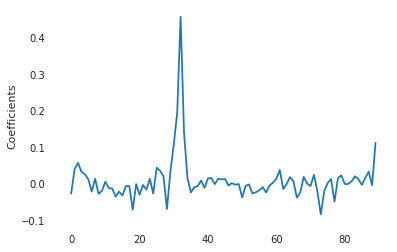

In [65]:
beta = pipe_model.stages[-1].coefficients
plt.plot(beta)
plt.ylabel('Coefficients')
plt.show()

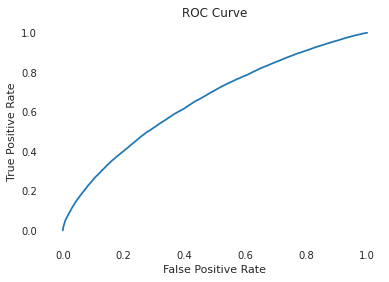

Training set areaUnderROC: 0.65538071568697


,FPR,TPR
0,0.000000,0.000000
1,0.002106,0.018985
2,0.005425,0.036588
3,0.009159,0.053719
4,0.014425,0.069103
...,...,...
98,0.970288,0.990035
99,0.984426,0.995308
100,0.999266,0.999782
101,1.000000,1.000000


In [66]:
trainingSummary = pipe_model.stages[-1].summary
roc = trainingSummary.roc.toPandas()
plt.plot(roc['FPR'],roc['TPR'])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve')
plt.show()
print('Training set areaUnderROC: ' + str(trainingSummary.areaUnderROC))
roc

In [67]:
fMeasure = trainingSummary.fMeasureByThreshold
maxFMeasure = fMeasure.groupBy().max('F-Measure').select('max(F-Measure)').head()
bestThreshold = fMeasure.where(fMeasure['F-Measure'] == maxFMeasure['max(F-Measure)']) \
    .select('threshold').head()['threshold']
maxFMeasure

Row(max(F-Measure)=0.6455130473531764)

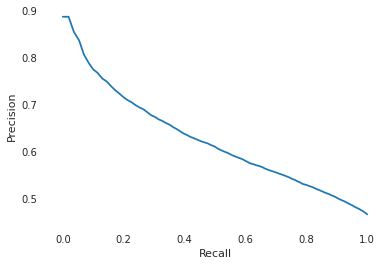

In [68]:
pr = trainingSummary.pr.toPandas()
plt.plot(pr['recall'],pr['precision'])
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.show()
#pr['recall']

In [69]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

In [70]:
va =feature.VectorAssembler(inputCols=featlist ,  outputCol='features')

In [71]:
sd = feature.StandardScaler(inputCol='features',outputCol = 'sdfeatures')

### Logistic model 2 with all features and reg param

In [72]:
lr = classification.LogisticRegression(labelCol='readmittedbinary', featuresCol='sdfeatures')

In [73]:
pipe_model2 = Pipeline(stages=[va,sd, lr])

In [74]:
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.1, 0.3, 0.5]).addGrid(lr.elasticNetParam, [0.2, 0.8, 0.5]).addGrid(lr.maxIter, [15, 30, 50]).build())

In [75]:
cv = CrossValidator(estimator=pipe_model2, \
                    estimatorParamMaps=paramGrid, \
                    evaluator=evaluator, \
                    numFolds=5)

In [76]:
cvModel = cv.fit(training_df)

In [77]:
AUC2 = evaluator.evaluate(cvModel.transform(validation_df))
AUC2

0.6494108155977659

In [78]:
param_dict = cvModel.bestModel.stages[-1].extractParamMap()

sane_dict = {}
for k, v in param_dict.items():
    #print(k)
    sane_dict[k.name] = v

best_reg = sane_dict["regParam"]
best_elastic_net = sane_dict["elasticNetParam"]
best_max_iter = sane_dict["maxIter"]
print(best_reg)
print(best_elastic_net)
print(best_max_iter)

0.1
0.2
15


### Random forest model 1

In [79]:
modelrf = Pipeline(stages= [va, classification.RandomForestClassifier(labelCol='readmittedbinary', featuresCol="features")])

In [80]:
modelrffit= modelrf.fit(training_df)

In [81]:
modelrfdf = modelrffit.transform(validation_df)

In [82]:
modelrfdf

DataFrame[Asian: bigint, Caucasian: bigint, Diabetes: bigint, Diabetes2: bigint, Diabetes3: bigint, Digestive: bigint, Digestive2: bigint, Digestive3: bigint, Genitourinary: bigint, Genitourinary2: bigint, Genitourinary3: bigint, Hispanic: bigint, Injury: bigint, Injury2: bigint, Injury3: bigint, Muscuskeletal: bigint, Muscuskeletal2: bigint, Muscuskeletal3: bigint, Neoplasms: bigint, Neoplasms2: bigint, Neoplasms3: bigint, Respiratory: bigint, Respiratory2: bigint, Respiratory3: bigint, male: double, age: int, time_in_hospital: int, num_lab_procedures: int, num_procedures: int, num_medications: int, number_outpatient: int, number_emergency: int, number_inpatient: int, number_diagnoses: int, readmitted: int, metformin_No: int, metformin_Steady: int, metformin_Up: int, repaglinide_No: int, repaglinide_Steady: int, repaglinide_Up: int, nateglinide_No: int, nateglinide_Steady: int, nateglinide_Up: int, chlorpropamide_No: int, chlorpropamide_Steady: int, chlorpropamide_Up: int, glimepiride

In [83]:
AUCrf = evaluator.evaluate(modelrffit.transform(validation_df))

In [84]:
AUCrf

0.653311404003921

In [85]:
pd.DataFrame(list(zip(featlist, modelrffit.stages[1].featureImportances.toArray())),
            columns = ['column', 'weight']).sort_values('weight', ascending = False).head(10)

,column,weight
32,number_inpatient,0.461266
31,number_emergency,0.113926
33,number_diagnoses,0.088851
30,number_outpatient,0.071256
29,num_medications,0.048134
26,time_in_hospital,0.034615
18,Neoplasms,0.022115
89,diabetesMed_Yes,0.020468
27,num_lab_procedures,0.018606
28,num_procedures,0.016158


In [86]:
tp = modelrfdf[(modelrfdf.readmittedbinary == 1) & (modelrfdf.prediction == 1)].count()
tn = modelrfdf[(modelrfdf.readmittedbinary == 1) & (modelrfdf.prediction == 0)].count()
fp = modelrfdf[(modelrfdf.readmittedbinary == 0) & (modelrfdf.prediction == 1)].count()
fn = modelrfdf[(modelrfdf.readmittedbinary == 0) & (modelrfdf.prediction == 0)].count()
print ("True Positives:", tp)
print ("True Negatives:", tn)
print ("False Positives:", fp)
print ("False Negatives:", fn)
#print ("Total", df.count())

r = (tp)/(tp + fn)
print ("recall", r)

p = float(tp) / (tp + fp)
print ("precision", p)

True Positives: 5841
True Negatives: 7863
False Positives: 3423
False Negatives: 12245
recall 0.32295698330200157
precision 0.6305051813471503


In [87]:
sensitivity = tn/(tn+fp)
print("Sensitivity",sensitivity)

Sensitivity 0.6967038809144073


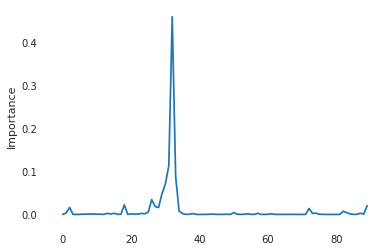

In [88]:
beta = modelrffit.stages[-1].featureImportances
plt.plot(beta)
plt.ylabel('Importance')
plt.show()

### Cross-Validation Random Forest Model

In [89]:
rf=classification.RandomForestClassifier(labelCol='readmittedbinary', featuresCol="features")

In [90]:
mrf = Pipeline(stages=[va,rf])

In [91]:
paramGrid = (ParamGridBuilder()
             .addGrid(rf.numTrees, [40]).addGrid(rf.maxDepth,[5,10,15,30]).build())



In [92]:
cvrf = CrossValidator(estimator=mrf, \
                    estimatorParamMaps=paramGrid, \
                    evaluator=evaluator, \
                    numFolds=3)

In [93]:
cvrf1 = cvrf.fit(training_df)

In [94]:
AUCn = evaluator.evaluate(cvrf1.transform(validation_df))
AUCn

0.665714210185341

In [95]:
param_dict1 = cvrf1.bestModel.stages[-1].extractParamMap()

sane_dict1 = {}
for k, v in param_dict1.items():
    #print(k)
    sane_dict1[k.name] = v


best_max_depth = sane_dict1["maxDepth"]
print(best_max_depth)

15


### Multiclass classification for Readmitted

In [96]:
modelrfmc = Pipeline(stages= [va, classification.RandomForestClassifier(labelCol='readmitted', featuresCol="features",maxDepth=15, numTrees=30)])

In [97]:
modelrffitmc= modelrfmc.fit(training_df)

In [98]:
evaluatormc = evaluation.MulticlassClassificationEvaluator(labelCol='readmitted',predictionCol="prediction",metricName="accuracy")
AUCrfmc = evaluatormc.evaluate(modelrffitmc.transform(validation_df))

In [99]:
AUCrfmc

0.5679558763448181

In [100]:
pd.DataFrame(list(zip(featlist, modelrffitmc.stages[1].featureImportances.toArray())),
            columns = ['column', 'weight']).sort_values('weight', ascending = False).head(10)

,column,weight
32,number_inpatient,0.149929
29,num_medications,0.077181
27,num_lab_procedures,0.072343
26,time_in_hospital,0.053630
25,age,0.052502
33,number_diagnoses,0.052018
30,number_outpatient,0.048695
31,number_emergency,0.046742
28,num_procedures,0.040295
24,male,0.015965


### Logistic Regression on top features of original Logistic Regression

In [101]:
model_new_lr2 = Pipeline(stages=[feature.VectorAssembler(inputCols=['number_inpatient', 'number_emergency', 'number_diagnoses', 'Diabetes', 'number_outpatient','time_in_hospital','diabetesMed_Yes','age','rosiglitazone_Steady','Caucasian'],
                                        outputCol='features'),sd,
                 classification.LogisticRegression(labelCol='readmittedbinary', featuresCol='sdfeatures')])


In [102]:
pipe_model3 = model_new_lr2.fit(training_df)
AUC5 = evaluator.evaluate(pipe_model3.transform(validation_df))
AUC5

0.651612958452991

### Random Forest on top features of original Logistic Regression

In [103]:
modelrfselected = Pipeline(stages= [feature.VectorAssembler(inputCols=['number_inpatient', 'number_emergency', 'number_diagnoses', 'Diabetes', 'number_outpatient','time_in_hospital','diabetesMed_Yes','age','rosiglitazone_Steady','Caucasian'],
                                        outputCol='features'), classification.RandomForestClassifier(labelCol='readmittedbinary', featuresCol="features",maxDepth=15, numTrees=30)])

In [104]:
modelrffitselected= modelrfselected.fit(training_df)

In [105]:
AUCrfselected = evaluator.evaluate(modelrffitselected.transform(validation_df))
AUCrfselected

0.6465890353110765

### Logistic Regression on top of Random Forest features

In [106]:
model_new_lr3 = Pipeline(stages=[feature.VectorAssembler(inputCols=['number_inpatient','num_medications','num_lab_procedures','number_diagnoses','time_in_hospital','age','number_emergency', 'number_outpatient','num_procedures','male'],
                                        outputCol='features'),sd,
                 classification.LogisticRegression(labelCol='readmittedbinary', featuresCol='sdfeatures')])


In [107]:
pipe_model4 = model_new_lr3.fit(training_df)
AUC6 = evaluator.evaluate(pipe_model4.transform(validation_df))
AUC6

0.6480212666068154

### Best model

In [108]:
best_model = Pipeline(stages= [va, classification.RandomForestClassifier(labelCol='readmittedbinary', featuresCol="features",maxDepth=10, numTrees=40)])

In [109]:
bestmodel_fit= best_model.fit(training_df)

Testing the best model so far on Testing data

In [110]:
AUCfinal = evaluator.evaluate(bestmodel_fit.transform(testing_df))

In [111]:
AUCfinal

0.6646133128238049

In [112]:
pd.DataFrame(list(zip(featlist, bestmodel_fit.stages[1].featureImportances.toArray())),
            columns = ['column', 'weight']).sort_values('weight', ascending = False).head(10)

,column,weight
32,number_inpatient,0.346935
31,number_emergency,0.084195
30,number_outpatient,0.067053
33,number_diagnoses,0.062323
29,num_medications,0.055528
26,time_in_hospital,0.038821
27,num_lab_procedures,0.038356
25,age,0.036750
28,num_procedures,0.027774
89,diabetesMed_Yes,0.017388


Fit the model to entire data

In [113]:
bestmodel_final_fit= best_model.fit(dummy_df)